In [ ]:
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 41.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.1/92.1 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 312.4/312.4 kB 37.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.8/144.8 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 11.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.5/71.5 kB 11.5 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.2-py3-none-any.whl s

In [ ]:
!pip install patchify

In [ ]:
import gradio as gr

In [ ]:

import os
import cv2
from PIL import Image
import numpy as np
from patchify import patchify
from sklearn.preprocessing import MinMaxScaler, StandardScaler
import matplotlib.pyplot as plt
import random
import matplotlib.colors as mcolors

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -U segmentation_models

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.7 MB/s eta 0:00:00


In [ ]:
from tensorflow.keras.models import load_model
minmaxscaler = MinMaxScaler()

In [ ]:
%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm

env: SM_FRAMEWORK=tf.keras
Segmentation Models: using `tf.keras` framework.


In [ ]:
weights = [0.166, 0.166, 0.166, 0.166, 0.166, 0.166]

In [ ]:
from keras import backend as k

In [ ]:
def jaccard_coef(y_true, y_pred):
  y_true_flatten = k.flatten(y_true)
  y_pred_flatten = k.flatten(y_pred)
  intersection = k.sum(y_true_flatten * y_pred_flatten)
  final_coef_value = (intersection + 1.0) / (k.sum(y_true_flatten) + k.sum(y_pred_flatten) - intersection + 1.0)
  return final_coef_value

In [ ]:
dice_loss = sm.losses.DiceLoss(class_weights=weights)

In [ ]:
focal_loss = sm.losses.CategoricalFocalLoss()

In [ ]:
total_loss = dice_loss + (1 * focal_loss)

In [ ]:
model = load_model('/content/drive/MyDrive/archive/pfemodel.h5', custom_objects=({'dice_loss_plus_1focal_loss': total_loss, 'jaccard_coef': jaccard_coef}))

In [ ]:
def image_patch(image):
  image_pieces = []
  image_patch_size = 256
  size_x = (image.shape[1]//image_patch_size) * image_patch_size
  size_y = (image.shape[0]//image_patch_size) * image_patch_size
  #print("{}-----{}--{}".format(image.shape, size_x, size_y))

  #Transformer le l'image (matrice) de type np.array en objet image
  image = Image.fromarray(image)

  #recadrer l'image
  image = image.crop((0, 0, size_x, size_y))

        #retransformer l'objet image en array
  image_to_compute = np.array(image)

  patched_images = patchify(image_to_compute, (image_patch_size, image_patch_size, 3), step=image_patch_size)
  for i in range(patched_images.shape[0]):
    for j in range(patched_images.shape[1]):
      individual_patched_image = patched_images[i, j]
      #print(individual_patched_image.shape)
      #Normalisation de l'image (normaliser les valeurs entre 0 et 1)
      individual_patched_image = minmaxscaler.fit_transform(individual_patched_image.reshape(-1, individual_patched_image.shape[-1])).reshape(individual_patched_image.shape)

              #Recuperer la matrice exacte de l'image
      individual_patched_image = individual_patched_image[0]
              #print(individual_patched_image.shape)
      image_pieces.append(individual_patched_image)
  return image_pieces, image_to_compute, patched_images

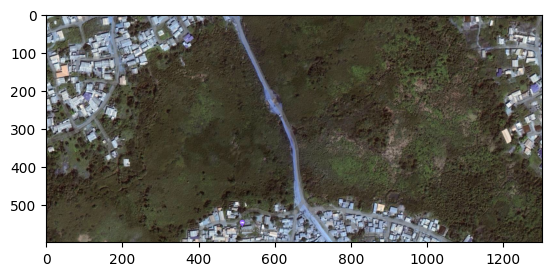

In [ ]:
initial_image = cv2.imread('/content/drive/MyDrive/imageTest/Est1.jpg', 1)
plt.imshow(initial_image)

In [ ]:
image_list, image_to_compute, patched_images= image_patch(initial_image)

In [ ]:
def pred_patch(images):
  pred_im = []
  for im in images:
    im= np.expand_dims(im, 0)
    pred = model.predict(im)
    predict = np.argmax(pred, axis=3)
    pred_image = predict[0, :, :]
    pred_im.append(pred_image)
  return pred_im

In [ ]:
predicted_image_list = pred_patch(image_list)

1/1 [==============================] - 0s 186ms/step


In [ ]:
def print_patch(images_list, patched_images):
  lines = patched_images.shape[0]
  cols  = patched_images.shape[1]
  y = len(images_list) * 5
  if lines <= 3:
    plt.figure(figsize=(19, 12))
    plt.gcf().subplots_adjust(left=0.05, bottom=0.0, right=0.95,  top = 0.95, wspace=0, hspace=0.135)
    for i in range(len(images_list)):
      ax = plt.subplot(lines, cols, i+1)
      ax.set_xticks([])
      ax.set_yticks([])
      plt.imshow(images_list[i])
    plt.savefig("split_image.png")
  elif lines > 3:
    plt.figure(figsize=(17, 10))
    plt.gcf().subplots_adjust(left=0.05, bottom=0.0, right=0.95,  top = 0.95, wspace=0, hspace=0.135)
    for i in range(len(images_list)):
      ax = plt.subplot(lines, cols, i+1)
      ax.set_xticks([])
      ax.set_yticks([])
      plt.imshow(images_list[i])
    plt.savefig("split_image.png")

In [ ]:
def percent(image):
  l = [0, 0, 0, 0, 0, 0]
  l2 = [0, 1, 2, 3, 4, 5]
  for i in range(image.shape[0]):
    for j in range (image.shape[1]):
      for k in l2:
        if image[i][j]==k:
          l[k]+=1
  l = np.array(l)
  l = l / np.sum(l)
  return l

In [ ]:
def list_percent(images):
  list_total = []
  for im in images:
    l = percent(im)
    list_total.append(l)
  return list_total

In [ ]:
predicted_image_percent = list_percent(predicted_image_list)

In [ ]:
def total_percent(predicted_image_percent):
  l = np.zeros(6)
  for i in range(len(predicted_image_percent)):
    l = l + predicted_image_percent[i]
  return l/len(predicted_image_percent)

In [ ]:
total_percent_list = total_percent(predicted_image_percent)

In [ ]:
def class_to_color(images):
  class_value = np.array([[ 41, 169, 226], [228, 193, 110], [88, 93, 94], [152, 16, 60], [ 4, 131, 12], [243, 240, 234]])
  class_value = class_value/255
  class_index = [0, 1, 2, 3, 4, 5]
  image_with_color = []
  for im in images :
    test = np.zeros((256, 256, 3))
    #im = np.expand_dims(im, axis=-1)
    for i in range(im.shape[0]):
      for j in range(im.shape[1]):
        for k in class_index:
          if im[i][j]==k:
            test[i][j] = class_value[k]
    image_with_color.append(test)
  return image_with_color

In [ ]:
predicted_image_list = class_to_color(predicted_image_list)

In [ ]:
def reconstitute_image(predicted_image_list, patched_image):
  reconstructed_image = np.zeros((patched_image.shape[0] * 256, patched_image.shape[1] * 256, 3), dtype=np.float32)
  a = 0
  while(a < len(patched_image)):
    for i in range(patched_image.shape[0]):
      for j in range(patched_image.shape[1]):
        reconstructed_image[(256*i):(256*(i+1)), (256*j):(256*(j+1)), :] = predicted_image_list[a]
        a += 1
  return reconstructed_image

In [ ]:
reconstructed_image = reconstitute_image(predicted_image_list, patched_images)

In [ ]:
plt.imshow(reconstructed_image)

In [ ]:
class_names = ["water", "land", "road", "building", "vegetation", "unlabeled"]
colors = ["#29A9E2", "#E4C66E", "#585D5E", "#98103C", "#04830C", "#F3F0EA"]
colors = [mcolors.to_rgba(color) for color in colors]

In [ ]:
def print_patch2(predictions, images):
  i = 0
  for a in range (len(predictions)):
    plt.figure(figsize=(30, 25))
    plt.subplot(int(len(predictions)),2, i+1)
    plt.imshow(images[a])
    i+=1
    plt.subplot(int(len(predictions)),2, i+1)
    plt.imshow(predictions[a])
    i = i+1
    a +=1
    fig = plt.gcf()
    plt.tick_params(labelsize=12)
    plt.gcf().subplots_adjust(left = 0.3, bottom = 0.2, right = 0.5, top = 0.8, wspace = 0.2, hspace = 0)

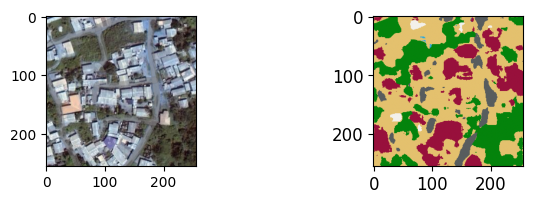

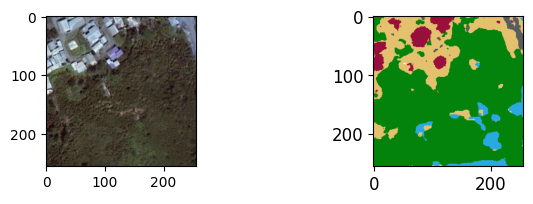

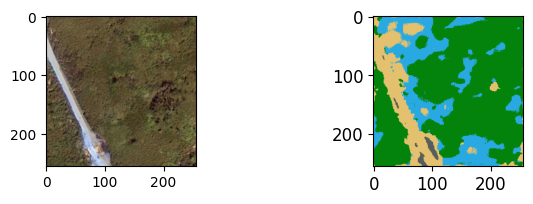

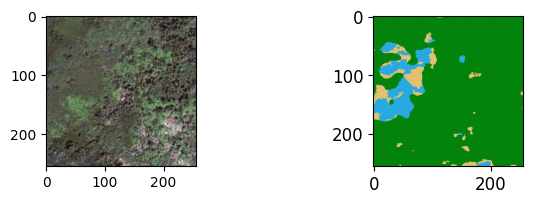

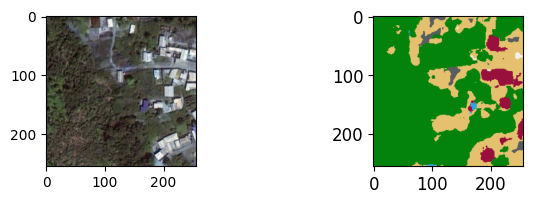

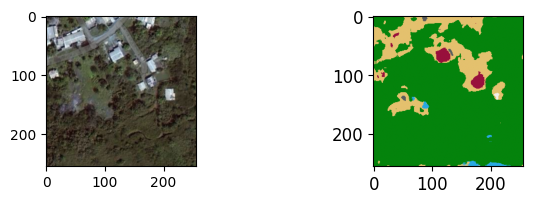

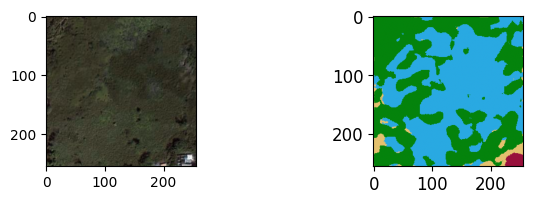

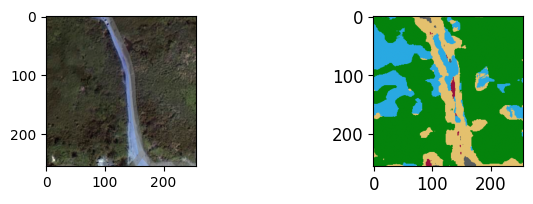

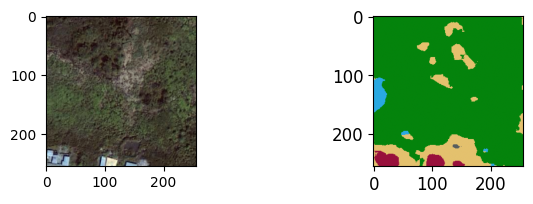

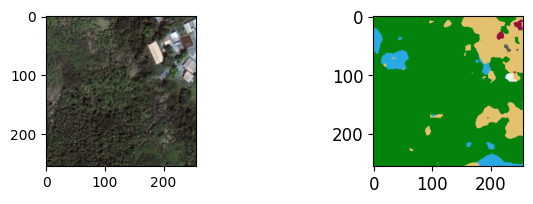

In [ ]:
print_patch2(predicted_image_list, image_list)

In [ ]:
def print_patch_with_chart(patched_image_list, predicted_image_list, predicted_image_percent, class_names):
  i = 0
  y = len(predicted_image_list) * 5
  for a in range (len(predicted_image_list)):
    plt.figure(figsize=(20, y))
    fig1 = plt.subplot(int(len(predicted_image_list)),3, i+1)
    plt.imshow(patched_image_list[a])
    i+=1
    fig2 = plt.subplot(int(len(predicted_image_list)),3, i+1)
    plt.imshow(predicted_image_list[a])
    i = i+1
    fig3 = plt.subplot(int(len(predicted_image_list)),3, i+1)
    pps = plt.bar(class_names, predicted_image_percent[a] , width=0.2, color=colors)
    for p in pps:
      height = float(round(p.get_height(), 3))
      fig3.annotate('{}'.format(height),
        xy=(p.get_x() + p.get_width() / 2, height),
        xytext=(0, 3), # 3 points vertical offset
        textcoords="offset points",
        ha='center', va='bottom')
    fig3.set_ylim(ymin=0, ymax=1.1)
    i = i+1
    a +=1
    fig = plt.gcf()
    plt.tick_params(labelsize=12)
    #plt.gcf().subplots_adjust(left=0.05, bottom=0.05, right=0.95, top=0.95, wspace=0.2, hspace=0.)
    #plt.savefig("pourcentageParClasse.jpg")

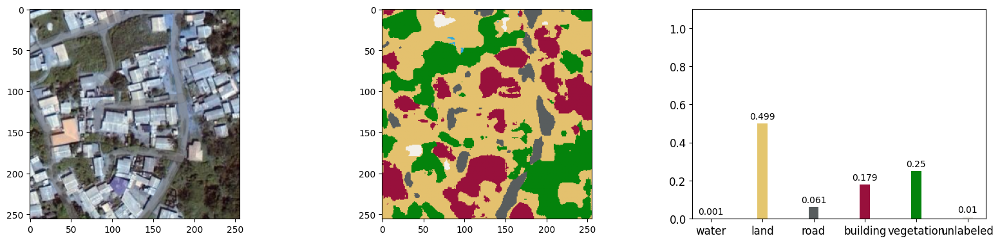

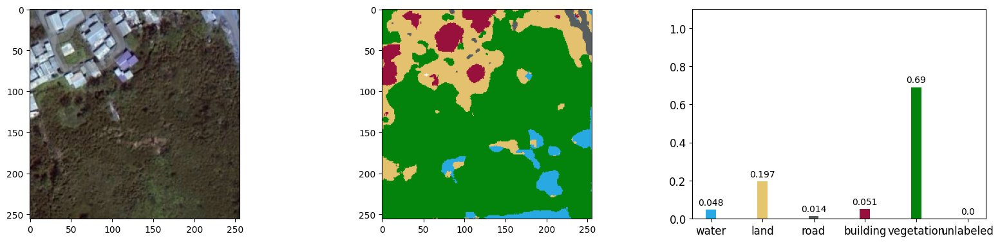

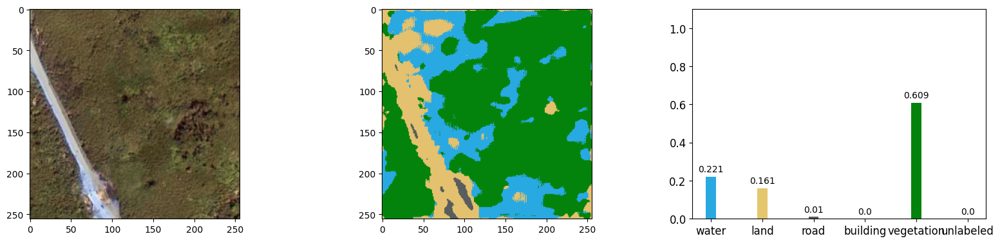

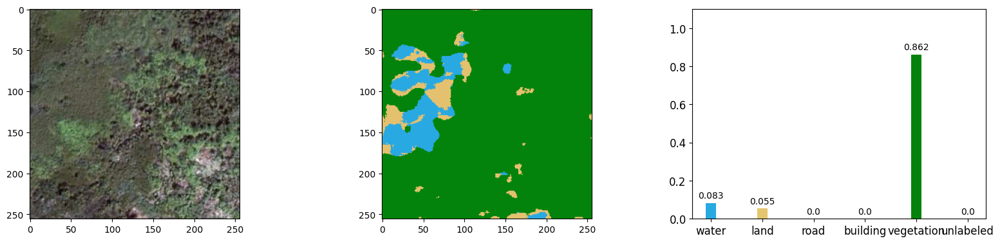

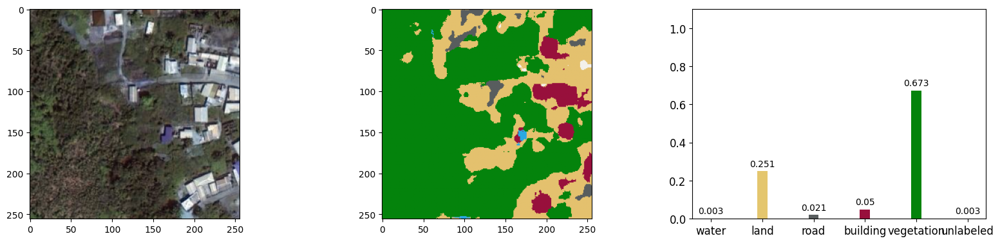

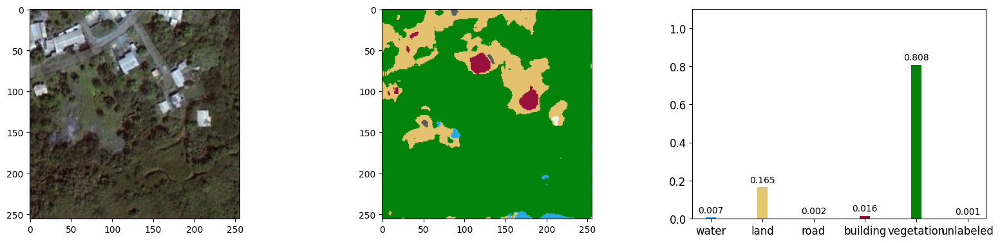

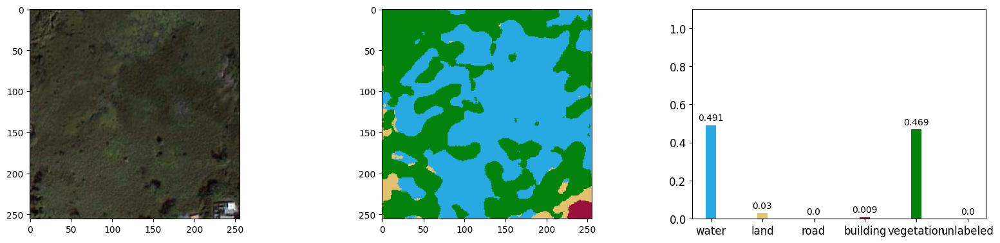

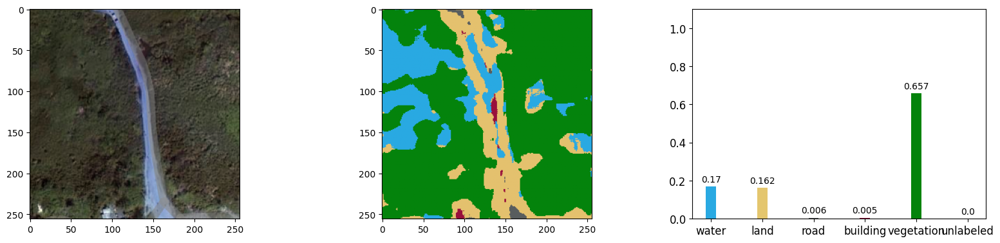

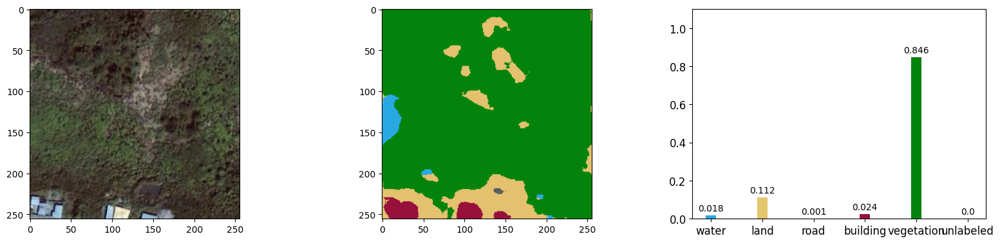

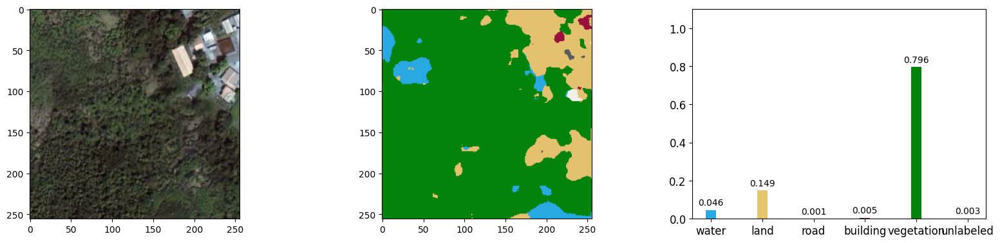

In [ ]:
print_patch_with_chart(image_list, predicted_image_list, predicted_image_percent, class_names)

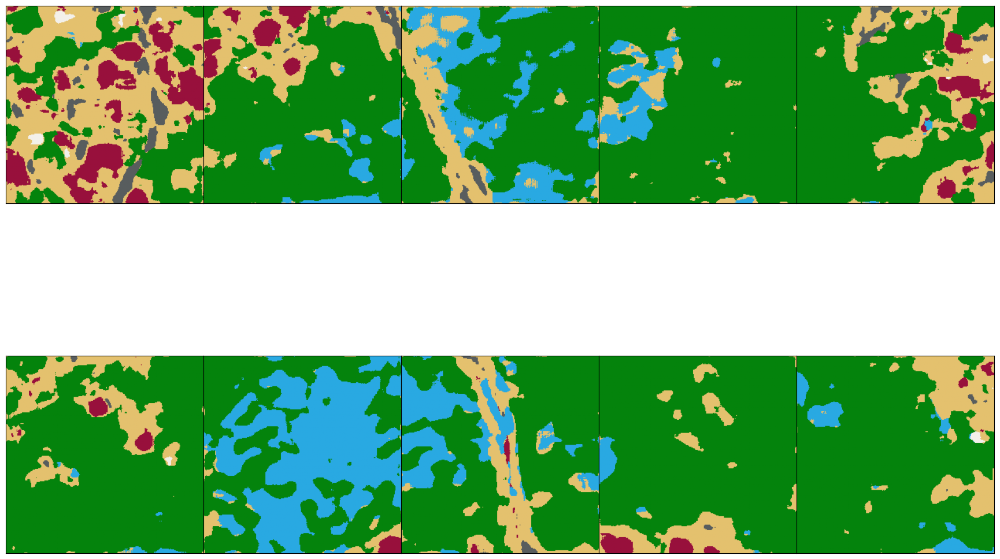

In [ ]:
print_patch(predicted_image_list, patched_images)

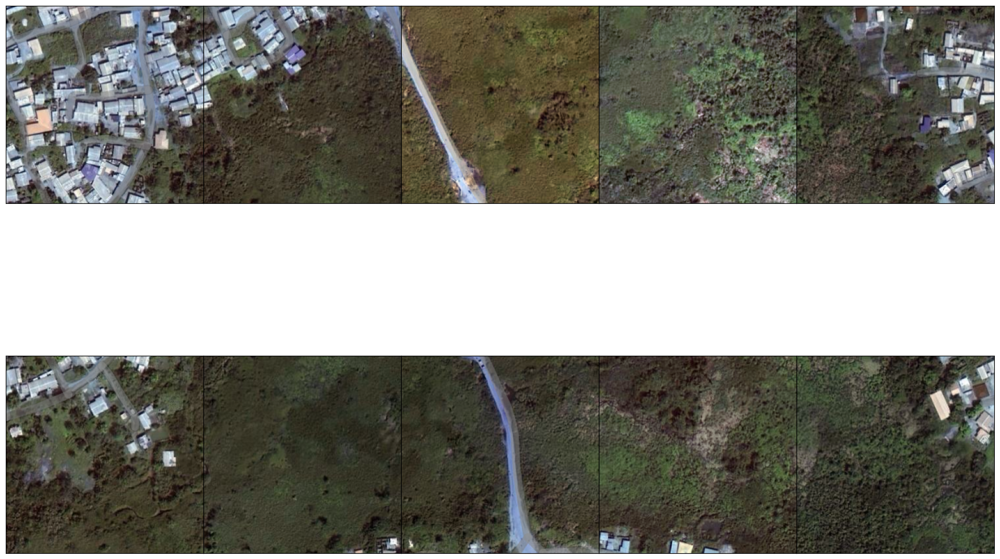

In [ ]:
print_patch(image_list, patched_images)

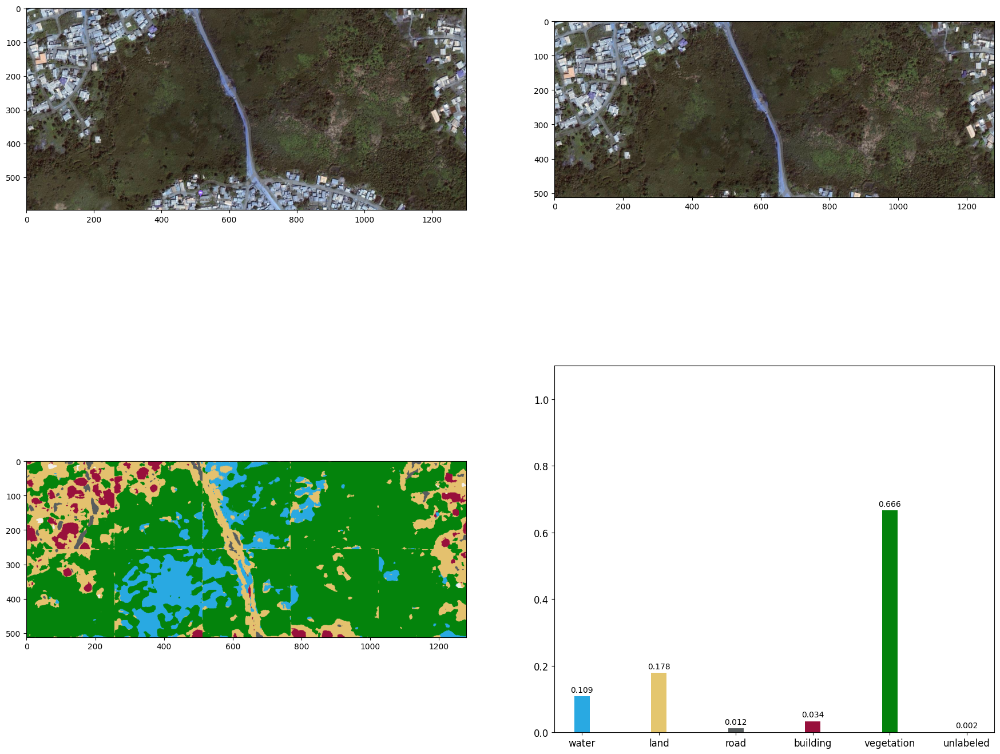

In [ ]:
plt.figure(figsize=(18, 15))
plt.subplot(221)
plt.imshow(initial_image)

plt.subplot(222)
plt.imshow(image_to_compute)

plt.subplot(223)
plt.imshow(reconstructed_image)

total_fig = plt.subplot(224)
pps2 = plt.bar(class_names, total_percent_list, width=0.2, color=colors )
for p in pps2:

  height = float(round(p.get_height(), 3))
  total_fig.annotate('{}'.format(height),
    xy=(p.get_x() + p.get_width() / 2, height),
    xytext=(0, 3), # 3 points vertical offset
    textcoords="offset points",
    ha='center', va='bottom')
total_fig.set_ylim(ymin=0, ymax=1.1)
fig = plt.gcf()
plt.tick_params(labelsize=12)
plt.gcf().subplots_adjust(left=0.05, bottom=0.05, right=0.99, top=0.99, wspace=0.2 , hspace=0.2)
#plt.savefig("summurize.jpg")

In [ ]:
def process_input_image(image_source):
  class_names = ["water", "land", "road", "building", "vegetation", "unlabeled"]
  colors = ["#29A9E2", "#E4C66E", "#585D5E", "#98103C", "#04830C", "#F3F0EA"]
  colors = [mcolors.to_rgba(color) for color in colors]
  image_list, image_to_compute, patched_images= image_patch(image_source)
  predicted_image_list = pred_patch(image_list)
  predicted_image_percent = list_percent(predicted_image_list)
  total_percent_list = total_percent(predicted_image_percent)
  predicted_image_list = class_to_color(predicted_image_list)
  reconstructed_image = reconstitute_image(predicted_image_list, patched_images)
  plt.figure(figsize=(18, 15))
  plt.subplot(221)
  plt.imshow(initial_image)

  plt.subplot(222)
  plt.imshow(image_to_compute)

  plt.subplot(223)
  plt.imshow(reconstructed_image)

  total_fig = plt.subplot(224)
  pps2 = plt.bar(class_names, total_percent_list, width=0.2, color=colors )
  for p in pps2:
    height = float(round(p.get_height(), 3))
    total_fig.annotate('{}'.format(height),
      xy=(p.get_x() + p.get_width() / 2, height),
      xytext=(0, 3), # 3 points vertical offset
      textcoords="offset points",
      ha='center', va='bottom')
  total_fig.set_ylim(ymin=0, ymax=1.1)
  fig = plt.gcf()
  plt.tick_params(labelsize=12)
  plt.gcf().subplots_adjust(left=0.05, bottom=0.05, right=0.99, top=0.99, wspace=0.2 , hspace=0.2)
  return "message", reconstructed_image

1/1 [==============================] - 0s 138ms/step


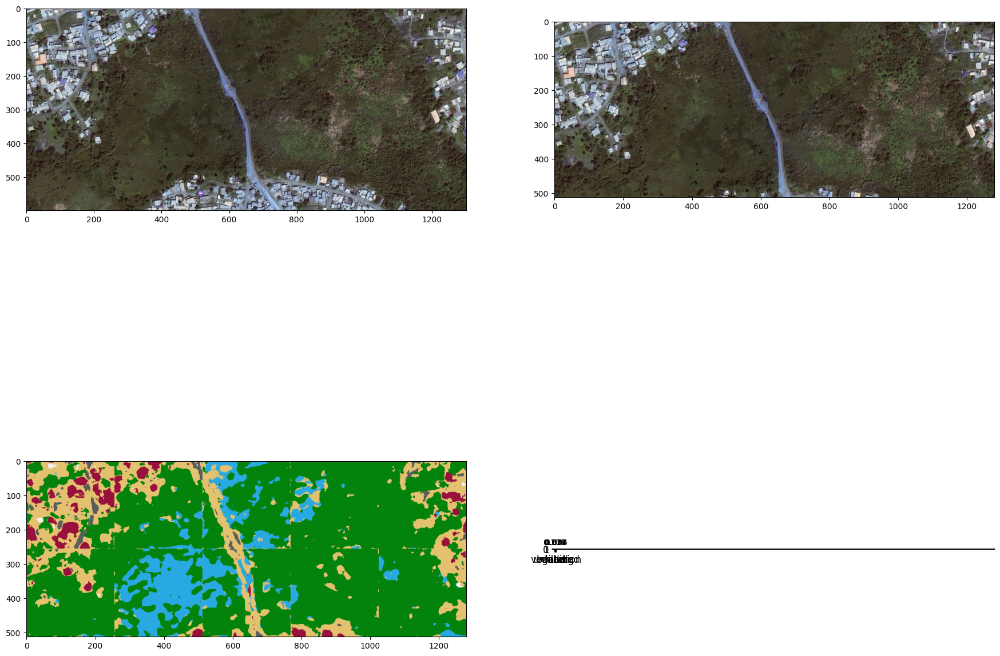

In [ ]:
test = process_input_image(initial_image)[1]
plt.imshow(test)

In [ ]:
def print_image_to_compute(image_to_compute):
  plt.title("Image to compute")
  plt.imshow(image_to_compute)
  fig = plt.gcf()
  fig.canvas.draw()
  image_array = np.array(fig.canvas.renderer.buffer_rgba())
  plt.close(fig)
  return image_array

In [ ]:
def print_image_statistics(patched_image_list, predicted_image_list, predicted_image_percent, class_names):
  l = []
  i = 0
  y = len(predicted_image_list) * 5
  for a in range (len(predicted_image_list)):
    plt.figure(figsize=(20, y))
    plt.subplot(int(len(predicted_image_list)),3, i+1)
    plt.imshow(patched_image_list[a])
    i+=1
    plt.subplot(int(len(predicted_image_list)),3, i+1)
    plt.imshow(predicted_image_list[a])
    i = i+1
    fig3 = plt.subplot(int(len(predicted_image_list)),3, i+1)
    pps = plt.bar(class_names, predicted_image_percent[a] , width=0.2, color=colors)
    for p in pps:
      height = float(round(p.get_height(), 3))
      fig3.annotate('{}'.format(height),
        xy=(p.get_x() + p.get_width() / 2, height),
        xytext=(0, 3), # 3 points vertical offset
        textcoords="offset points",
        ha='center', va='bottom')
    fig3.set_ylim(ymin=0, ymax=1.1)
    i = i+1
    a +=1
    fig = plt.gcf()
    plt.tick_params(labelsize=12)
    plt.title("Image predictions and statistics")
    plt.gcf().subplots_adjust(left=0.05, bottom=0.05, right=0.99, top=0.95, wspace=0.2 , hspace=0.2)
    fig = plt.gcf()
    fig.canvas.draw()
    image_array = np.array(fig.canvas.renderer.buffer_rgba())
    l.append(image_array)
    plt.close(fig)
  return l


In [ ]:
def print_image_statistics2(patched_image_list, predicted_image_list, predicted_image_percent, class_names):
    num_images = len(predicted_image_list)
    fig = plt.figure(figsize=(20, num_images * 5))
    plt.suptitle("Image predictions and statistics", fontweight="bold", fontsize=30)
    for i in range(num_images):
        ax1 = fig.add_subplot(num_images, 3, 3*i+1)
        ax1.imshow(patched_image_list[i])
        ax1.set_title("Initial Image Block "+str(i), fontweight="bold", fontsize=20, pad=30)

        ax2 = fig.add_subplot(num_images, 3, 3*i+2)
        ax2.imshow(predicted_image_list[i])
        ax2.set_title("predicted Image Block "+str(i), fontweight="bold", fontsize=20, pad=30)

        ax3 = fig.add_subplot(num_images, 3, 3*i+3)
        bars = ax3.bar(class_names, predicted_image_percent[i], width=0.2, color=colors)
        ax3.set_title("Predicted Image Statistics "+str(i), fontweight="bold", fontsize=20, pad=30)
        for bar in bars:
            height = float(round(bar.get_height(), 3))
            ax3.annotate('{}'.format(height),
                          xy=(bar.get_x() + bar.get_width() / 2, height),
                          xytext=(0, 3),  # 3 points vertical offset
                          textcoords="offset points",
                          ha='center', va='bottom')
        ax3.set_ylim(ymin=0, ymax=1.1)
        ax3.tick_params(labelsize=12)
    fig.tight_layout()
    fig.subplots_adjust(left=0.05, bottom=0.05, right=0.99, top=0.90, wspace=0.2, hspace=0.5)
    fig = plt.gcf()
    fig.canvas.draw()
    image_array = np.array(fig.canvas.renderer.buffer_rgba())
    plt.close(fig)
    return image_array


In [ ]:
autre_test = print_image_statistics2(image_list, predicted_image_list, predicted_image_percent, class_names)

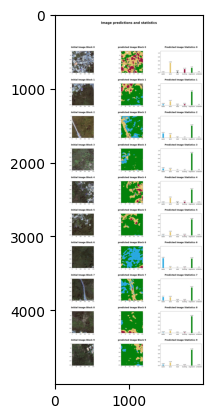

In [ ]:
plt.imshow(autre_test)

In [ ]:
def print_total_image(image_source, image_to_compute, reconstructe_image, class_names, total_percent_list):
  plt.figure(figsize=(18, 15))
  plt.suptitle("Image Process Summary", fontweight="bold", fontsize=30)
  plt.subplot(221)
  plt.imshow(image_source)
  plt.title("Initial Image", fontweight="bold", fontsize=20, pad=30)

  plt.subplot(222)
  plt.imshow(image_to_compute)
  plt.title("image_to_compute", fontweight="bold", fontsize=20, pad=30)
  plt.subplot(223)
  plt.imshow(reconstructe_image)
  plt.title("reconstructe_image", fontweight="bold", fontsize=20, pad=30)
  total_fig = plt.subplot(224)
  pps2 = plt.bar(class_names, total_percent_list, width=0.2, color=colors )
  total_fig.set_title("Global statistics", fontweight="bold", fontsize=20, pad=30)
  for p in pps2:
    height = float(round(p.get_height(), 3))
    total_fig.annotate('{}'.format(height),
      xy=(p.get_x() + p.get_width() / 2, height),
      xytext=(0, 3), # 3 points vertical offset
      textcoords="offset points",
      ha='center', va='bottom')
  total_fig.set_ylim(ymin=0, ymax=1.1)
  fig = plt.gcf()
  plt.tick_params(labelsize=12)
  fig.subplots_adjust(left=0.05, bottom=0.05, right=0.99, top=0.90, wspace=0.2, hspace=0.5)

  fig = plt.gcf()
  fig.canvas.draw()
  image_array = np.array(fig.canvas.renderer.buffer_rgba())
  plt.close(fig)
  return image_array

In [ ]:
autre_test = print_total_image(initial_image, image_to_compute, reconstructed_image, class_names, total_percent_list)

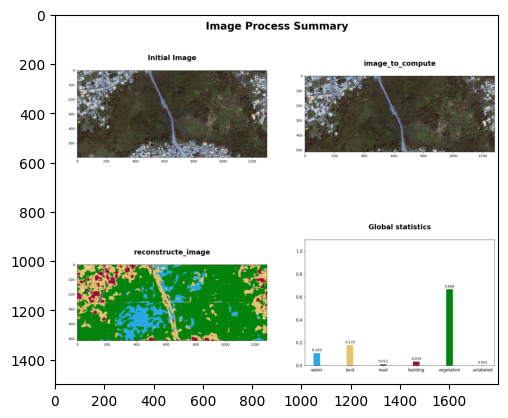

In [ ]:
plt.imshow(autre_test)

In [ ]:
def reconstitute_image(predicted_image_list, patched_image):
  reconstructed_image = np.zeros((patched_image.shape[0] * 256, patched_image.shape[1] * 256, 3), dtype=np.float32)
  a = 0
  while(a < len(patched_image)):
    for i in range(patched_image.shape[0]):
      for j in range(patched_image.shape[1]):
        reconstructed_image[(256*i):(256*(i+1)), (256*j):(256*(j+1)), :] = predicted_image_list[a]
        a += 1
  return reconstructed_image

In [ ]:
def global_function(source_image):

  class_names = ["water", "land", "road", "building", "vegetation", "unlabeled"]
  colors = ["#29A9E2", "#E4C66E", "#585D5E", "#98103C", "#04830C", "#F3F0EA"]
  colors = [mcolors.to_rgba(color) for color in colors]
  image_list, image_to_compute, patched_images= image_patch(source_image)

  predicted_image_list = pred_patch(image_list)

  predicted_image_percent = list_percent(predicted_image_list)
  total_percent_list = total_percent(predicted_image_percent)

  predicted_image_list = class_to_color(predicted_image_list)
  reconstitute = reconstitute_image(predicted_image_list, patched_images)





  compute_img_output = print_image_to_compute(image_to_compute)
  list_images_output = print_image_statistics2(image_list, predicted_image_list, predicted_image_percent, class_names)

  image_total = print_total_image(source_image, image_to_compute, reconstitute, class_names, total_percent_list)
  return compute_img_output, list_images_output, image_total

In [ ]:
my_app = gr.Blocks()
with my_app:
  gr.Markdown("ImageProcessing Application UI With Gradio")
  with gr.Tabs():
    with gr.TabItem("Choose your Image"):
      with gr.Row():
        with gr.Column():
          img_source = gr.Image(label = "Please select a source image")
          source_image_loader = gr.Button("Process This Image")
        with gr.Column():
          compute_img_output = gr.Image(Label = "Image after resize")
      with gr.Row():
        list_images_output = gr.Image(Label = "Image Process Steps")
      with gr.Row():
        image_total = gr.Image(Label = "Image Process Summury")

    source_image_loader.click(
        global_function,
        [
            img_source
        ],
        [
            #output_label,
            compute_img_output, list_images_output, image_total
        ]

    )

<ipython-input-34-16001c6f61c9>:11: GradioUnusedKwargWarning: You have unused kwarg parameters in Image, please remove them: {'Label': 'Image after resize'}
  compute_img_output = gr.Image(Label = "Image after resize")
<ipython-input-34-16001c6f61c9>:13: GradioUnusedKwargWarning: You have unused kwarg parameters in Image, please remove them: {'Label': 'Image Process Steps'}
  list_images_output = gr.Image(Label = "Image Process Steps")
<ipython-input-34-16001c6f61c9>:15: GradioUnusedKwargWarning: You have unused kwarg parameters in Image, please remove them: {'Label': 'Image Process Summury'}
  image_total = gr.Image(Label = "Image Process Summury")


In [ ]:
<my_app.launch(debug=True, share=True)

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
Running on public URL: https://20b968abb5443c99ed.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from Terminal to deploy to Spaces (https://huggingface.co/spaces)


1/1 [==============================] - 0s 191ms/step
